In [1]:
!pip install dfply
!pip install plotly
import pandas as pd
import numpy as np
import math
from dfply import *
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statistics 
import plotly.graph_objects as go
from scipy import stats
from scipy.stats import pearsonr
import plotly.graph_objects as go
import warnings
from scipy.stats import shapiro

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
players = pd.read_pickle("/content/drive/My Drive/Capstone/Data/Clean/Players_Clean.pkl")
players.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15699 entries, 0 to 15698
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   tm_id                15699 non-null  int64         
 1   name                 15699 non-null  object        
 2   club                 15699 non-null  object        
 3   nationality          15699 non-null  object        
 4   dob                  15639 non-null  datetime64[ns]
 5   height               15699 non-null  float64       
 6   sf                   15699 non-null  category      
 7   field_position       15699 non-null  category      
 8   joined               15600 non-null  datetime64[ns]
 9   contract_expires     13860 non-null  datetime64[ns]
 10  followers            4436 non-null   float64       
 11  sofifa_id            10381 non-null  float64       
 12  years_left           13860 non-null  category      
 13  age                  15639 non-

# Players' age

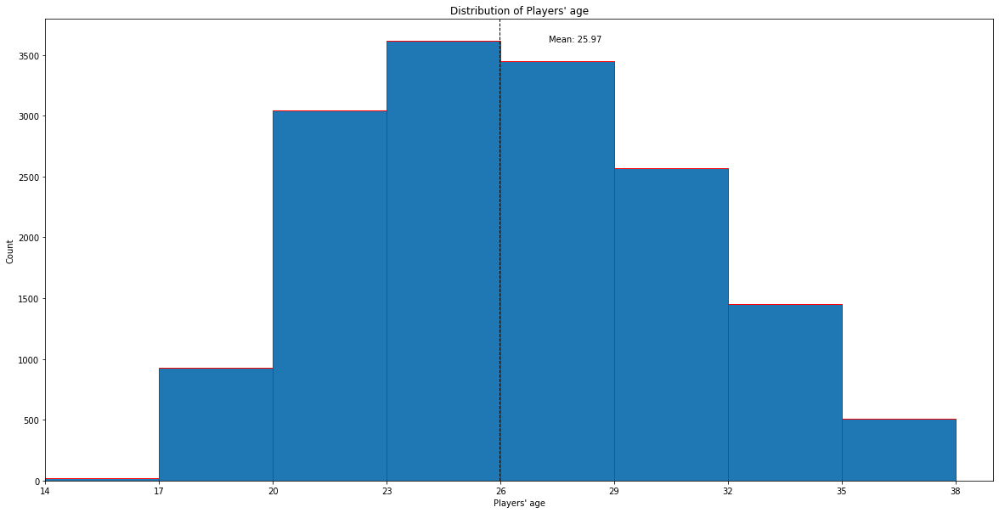

In [3]:
def age_histogram(df = players):
  age = df.age
  q1 = age.quantile(0.25)
  q3 = age.quantile(0.75)
  iqr = q3 - q1
  u_cond = age >= q1 - 1.5 * iqr
  l_cond = age <= q3 + 1.5 * iqr
  age_no_out = age[np.logical_and(u_cond, l_cond)]
  age_no_out = list(map(lambda x: int(x), age_no_out))
  plt.figure(figsize = (20,10))
  plt.hist(age_no_out, bins = range(min(age_no_out), max(age_no_out)+1, 3), histtype='bar', ec='red')
  plt.axvline(np.mean(age_no_out), color='k', linestyle='dashed', linewidth=1)
  plt.xlim(min(age_no_out), max(age_no_out))
  plt.xticks(np.arange(min(age_no_out), max(age_no_out)+1, 3))
  min_ylim, max_ylim = plt.ylim()
  plt.text(np.mean(age_no_out)*1.05, max_ylim*0.95, 'Mean: {:.2f}'.format(np.mean(age_no_out)))
  plt.xlabel("Players' age")
  plt.ylabel("Count")
  plt.title("Distribution of Players' age")

age_histogram(df = players)

As we can see the distributin of the players' age looks like it comes from the normal(bell-shaped) distribution. The mean age of the footballer's is around 26, this is the age where most of the players are on their peak level or very close to that level, as the players in this age category usually have both solid playing experience (in average about 8 years as most of the players start their career at the age of 18) and good physicall attributes such as stamina height and others. As we can there are no players older than 38 which is very often the player's career ending age. The dataset also included some older players, for example one of the players is 53 years old, but these cases are very rare and in order to not disturb the overall picture the outliers were removed for plotting. In order to check if the assumption about normality can be correct let's perform a statistical test 

In [4]:
warnings.filterwarnings('ignore')
p,stat = shapiro(players[players.age.notnull()].age)
if(p > 0.05):
  print("Failed to reject H0, Data looks like Gaussian(Normal) with p = {0}".format(p))
else:
  print("Reject H0, Data does not look like Gaussian(Normal)with p = {0}".format(p))

Failed to reject H0, Data looks like Gaussian(Normal) with p = 0.9802247285842896


According to the test results there is high probability that the distribution comes from normal bell-shaped distribution

In [0]:
def_positions = ["goalkeepers","defenders","midfielders", "attackers"]
def mv_scatter(df, feature, x_label, positions = def_positions, remove_outliers = False):
  plot_df = (df >> 
             mask(X[feature].notnull(), X.current_mv.notnull(), X.main_field_position.isin(positions)))
  plot_df.sf = plot_df.sf.astype("object")
  ft = plot_df.current_mv
  if(remove_outliers):
    plot_df = plot_df[plot_df["current_mv"].between(ft.quantile(.15), ft.quantile(.85))]
  corr, _ = pearsonr(plot_df[str(feature)], plot_df.current_mv)
  print('Pearsons correlation %.3f for %s and current_mv' % (corr, feature))
  fig = px.scatter(plot_df, x=feature, y="current_mv",
                   color = "main_field_position", trendline = "ols",
                   title="Market value VS {0}".format(feature.capitalize()),
                   labels = {feature: x_label, "current_mv":"Player's Market value"},                   
                   hover_data = ["name","sf","nationality"], opacity = 0.7)
  fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
  fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
  fig.for_each_trace(lambda t: t.update(name=t.name.split("=")[1]))  
  fig.show()


def mv_scatter_pos_facet(df, feature, x_label, remove_outliers = False):
  plot_df = (df >> 
             mask(X[feature].notnull(), X.current_mv.notnull()))
  plot_df.sf = plot_df.sf.astype("object")
  ft = plot_df.current_mv
  if(remove_outliers):
    plot_df = plot_df[plot_df["current_mv"].between(ft.quantile(.15), ft.quantile(.85))]
  fig = px.scatter(plot_df, x=feature, y="current_mv",
                   color = "main_field_position",
                   title="Market value VS {0}".format(feature.capitalize()),
                   labels = {feature: x_label, "current_mv":"Player's Market value"},                   
                   hover_data = ["name","sf","nationality"], opacity = 0.7, 
                   facet_col = "main_field_position", facet_col_wrap=2)
  fig.update_layout(showlegend=False)
  fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
  fig.for_each_trace(lambda t: t.update(name=t.name.split("=")[1]))
  fig.show()

# Market value and correlated variables

In [6]:
mv_scatter(players, "age", "Player's age")

Pearsons correlation -0.044 for age and current_mv


# Market value and age

As we can see the correlation between the age and market value is negative. Starting from some moment the market value of the player decreases with the age increasing. Most of the expensive player's are in the age period of 20-26 as in these years their market value increases alongside with the age, as for this age period the player's don't loose in their physical attributes but gain more experience so their market value increases too. As we can see most of the players' market value is less than 100 millions, and only a few players have higher markekt value. Most of these players are young superstars. For example K.Mbappe who is the most expensive player in our dataset has market value of 200 millions at the age of 20. According to his age he has not reached his peak of perfomance yet, but already has a very high market value. Most of the other expensive players are on their peak level of perfomance or very close to it, as they are in 25-28 age period. Examples are Kevin De Bruyne or Antuan Griezmen. As we can se the market value of the players' drastically drops after they turn 30, except some superstars and legends of the game such as Messi and Ronaldo who being aged 32 and 35 have market values of 140 millions and 75 millions accordingly. There are also other aged players who have pretty decent market value for their age such as Karim Benzema(35 millions, 32 years old) or Angel Di Maria(40 millions, 32 years old), but their market value does not overcome 40 millions.

In [7]:
mv_scatter_pos_facet(players, "age", "Player's age")

As we can see most of the expensive players are either attackers or midfielders.
Only a few goalkeepers and defenders have significantly high market values. Also we can see that in general almost all the positions have the same age period where the players have their highest market values.

# Market value and popularity

In [8]:
mv_scatter(players, "followers", "Player's followers")

Pearsons correlation 0.387 for followers and current_mv


Nowadays soccer is a very profitable business with lots of attractive contracts from huge companies, for both the players and the clubs. Taking that into acount the famous soccer teams consider the player's popularity too when buying him as if the the player has good perfomance metrics and is also popular in the world than they can make huge profits from the contracts of the player. Taking this into acount let's check the correlation between the number of player's instagram followers and his market value. As we can see the correlation is positive meaning that in general the more popular(more followers instagram) the player is the higher his market value. In this case the age of the player is not a key factor as the number of the player's followers is mostly not dependent on his playing attributes. As we can there only a few players who have significantly high amount of followers. Most of these players are the ones described in the market value vs age visualization. As most of the expensive players have highest number of followers. Cristiano Ronaldo actually is the person with the highest number of followers in instagram.

In [21]:
mv_scatter_pos_facet(players, "followers", "Player's followers")

We can see that the most popular position is attackers as players having attacking posiiton enjoy the highest popularity among social media users. The situatuin is very similar for defenders and midfielders as both positions players have more or less the same ration of market value / followers. However we can see that the goalkeepers are not that popular among social media users as for example one of the most expensive players of the dataset Yan Oblak who has market value of 100 million euros has onnly about 1 million followers, whereas the attackers who have aproximately the same market value enjoy double triple and even more number of followers.

# Market value and categorical variables

In [0]:
def cat_num_boxplot(df, cat_feature, num_feature, x_label, y_label, title, remove_outliers = True):
  plot_df = ( df >>
             mask(X[cat_feature].notnull(), X[num_feature].notnull()))
  ft = plot_df[num_feature]
  if(remove_outliers):
    plot_df = plot_df[plot_df[num_feature].between(ft.quantile(.15), ft.quantile(.85))]
  if(cat_feature == "years_left"):
    plot_df = plot_df.sort_values(by = cat_feature)
  fig = px.box(plot_df, x=cat_feature, y=num_feature,
               title=title,
               labels = {cat_feature: x_label, num_feature: y_label},
               hover_data = ["name","nationality","age","league","club"],
               )
  fig.update_layout(xaxis_type='category')
  fig.show()

In [11]:
cat_num_boxplot(players, "main_field_position","current_mv","Player's Position","Player's Market value",
           "Market value by players' position(no outliers)", remove_outliers = True)

Let's take a look at the general distribution of the players' market value based by their position. As during the market value vs age plot we already saw the player's market value based by position, let's remove outliers for this visualization. After removing the outliers the most expensive players have market value of around 3.5 million euros. This was excpected as our dataset contains about 16000 players from the top 33 leagues of the world and the expensive players are very densely distributed among the top 7 - top 10 leagues of the world, and only rare players have significantly high market value in leagues other than the top 10. After removing the outliers the attackers in general are still the most expensive position, the defenders and midfielders are in general valued equally, wheras the goalkeepers are again valued lower than the other positions.

In [12]:
cat_num_boxplot(players, "years_left","current_mv","Player's contract's expiry years","Player's market value",
           "Market value by players' contract expiry", remove_outliers = False)

Now let's see how does the expiry years of the player's contract affect his market value. As expected the players' whose contract expires at the end of the season have the lowest market value as at the end of the season if they do not expand their contract, other teams can sign them for free. Similar situation is for players who have one more year according to their contract. Those players are valued higher as their teams still have the chance of negotiating the player's contract or sell them by relatively high price. The player's who have 2 years remaining to their contract are usually those who can be sold by very high price as if the team fails to agree terms with the player, they can sell him on a very good deal. The player's who have 3 or more years on their contract most of the time joined the team recently(1 or 2 years ago as based on age the teams mostly sign new players for averagely 5 years) or have recently extended their contract at the club.

In [13]:
cat_num_boxplot(players, "years_left","current_mv","Player's contract's expiry years","Player's market value",
           "Market value by players' contract expiry(no outliers)", remove_outliers = True)

As we can see after removing the players with outlying market values, most of the players have expiring contracts or only a year left.

In [14]:
cat_num_boxplot(players, "continent", "current_mv", "Player's continent", "Player's Market value",
                "Market value by players' continent", remove_outliers = False)

As we can see the player's from europian countries are valued the highest, which is logical as most of them play in european leagues. Players from South America and Africa are also highly valued as the south americans are mostly very talented and have good technique and the african player's have great physical conditions. The other continents are in general similar in terms of the market value of their players. Only a few Asian or North American players have high market values and the others are no different based on the continent.

In [15]:
cat_num_boxplot(players, "continent", "current_mv", "Player's continent", "Player's Market value",
                "Market value by players' continent(no outliers)", remove_outliers = True)

As we can see situation changes a little bit when we remove the outliers as Asian players become more valued and African players having the highest values in general. Generally the African players offer good quality/price ratio as most of them are in general valued low in comparison with European or South American players, but have similar or even better playing attributes. There is a seperate section about African player's benefits in a international soccer bestseller book SOCCERNOMICS.

In [16]:
cat_num_boxplot(players, "league_class","current_mv","Player's league's class","Player's Market value",
           "Market value by players' league's ranking", remove_outliers = False)

# Position specific attributes

In [17]:
cat_num_boxplot(players, "main_field_position", "age", "Player's Position", "Player's age",
                "Players' age by Positon", remove_outliers = False)

As we can see the positions where there are more players with generally older age are goalkeeprs and defenders. These two positions in soccer require good experience in the game and some times the player's ability to understand the opponent (which ussualy is high among experienced players) is valued even more than his physical attributes as the player can compensate those with his experience. Good examples are Italian goalkeepers and defenders who sometimes play up to 40 and do not lose their quality. The midfielders and attackers are ussualy younger as they do a lot of physical work on the field and old players mostly fail to keep their high level in this positions due to physical attributes which get worse by their age.

In [18]:
cat_num_boxplot(players, "main_field_position", "height", "Player's Position", "Player's Height",
                "Players' height by positon", remove_outliers = False)

Another attribute that can be important for the player based on his position is height. As we can see high height is very important for the goalkeepers as the players with the highest height are goalkeepers and only minority of the goalkeepers have height of lower than 180 cm. Most of the defenders and attackers also have high heights but not as high as the goalkeepers and some of the players from these positions have heights lower or equal to 160 cm. According to this visualization the height of the player is least important for midfielders.

In [19]:
mv_scatter(players, "height", "Player's Height", ["goalkeepers"], remove_outliers = False)

Pearsons correlation 0.054 for height and current_mv


As we can see the height of the goalkeepers is positively correlated with their market value. The correlation is not strong, as most of the goalkeepers are not valued very high anyway, but the heihgt has a little impact on their price.

In [20]:
positions_df = players >> mask(X.field_position.notnull(),X.sf.notnull())
positions_df = positions_df[positions_df.sf != "no_info"]
positions_df = (positions_df >> 
                group_by(X.sf, X.field_position) >> 
                summarize(count = X.sf.count()) >> 
                mask(~X["field_position"].isin(["MF","FW","DF"])))
fig = px.bar(positions_df, x='sf', y = "count", color = "sf", 
             facet_col = "field_position",facet_col_wrap = 4,
             barmode = "relative", labels = {"count":"","sf":""},
             title = "Player's strong foot based on his position on the field")
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
fig.for_each_trace(lambda t: t.update(name=t.name.split("=")[1]))
fig.show()